In [2]:
# Load Reticulate function
Sys.setenv(RETICULATE_PYTHON="/home/luca/anaconda3/envs/reticulate/bin/python")
library(reticulate)
reticulate::use_python("/home/luca/anaconda3/envs/reticulate/bin/python")
reticulate::use_condaenv("/home/luca/anaconda3/envs/reticulate")
reticulate::py_module_available(module='anndata') #needs to be TRUE
reticulate::import('anndata') #good to make sure this doesn't error
reticulate::py_module_available(module='leidenalg') #needs to be TRUE
reticulate::import('leidenalg') #good to make sure this doesn't error

[1] TRUE

Module(anndata)

[1] TRUE

Module(leidenalg)

# Settings

In [3]:
## Patch for annotations in R4.1
# BiocManager::install("Bioconductor/GenomeInfoDb",lib = "/home/luca/R/x86_64-pc-linux-gnu-library/4.1",force = TRUE)
# library(GenomeInfoDb,lib.loc="/home/luca/R/x86_64-pc-linux-gnu-library/4.1")

In [4]:
# Load packages
pacman::p_load(dplyr, stringr, data.table, tidyr, data.table, Matrix,
               hdf5r, Seurat, Signac,harmony, knitr, SoupX,
               logr, parallel, 
               ggplot2, ggpubr, ggrepel, ggbreak, gridExtra, grid, ggh4x)

In [5]:
# Set options
options(stringsAsFactors = FALSE)
options(scipen = 99999)
warnLevel <- getOption('warn')
options(warn = -1)
opts_chunk$set(tidy=TRUE)

In [6]:
# Set directories
fastq.dir = "/nfs/lab/projects/COVID_mouse/raw_data/230616_A01535_0344_BH7LF2DSX7_2/FASTQ"
base.dir = "/nfs/lab/projects/COVID_mouse/"
assets.dir = "/nfs/lab/projects/COVID_mouse/assets/"
cell.ranger.dir = paste(base.dir, "cell.ranger/", sep = "")
seurat.dir = paste(base.dir, "seurat/", sep = "")
step1.dir = paste(seurat.dir, "1_pre.processing/", sep = "")

In [7]:
# start log
options("logr.on" = TRUE, "logr.notes" = TRUE)
options("logr.autolog" = TRUE)
options("logr.compact" = TRUE)
options("logr.traceback" = TRUE)
log.file = paste(base.dir, Sys.Date(),".1_Pre-processing.log", sep="")

In [8]:
log_open(log.file)

[1] "/nfs/lab/projects/COVID_mouse/log/2023-08-14.1_Pre-processing.log"

In [9]:
step1.dir

[1] "/nfs/lab/projects/COVID_mouse/seurat/1_pre.processing/"

# Load sample list

In [10]:
setwd(cell.ranger.dir)
sample.ls = dir()
sample.ls

[1] "1_GFP1"  "10_G1C1" "11_G1C2" "12_G1C3" "2_GFP2"  "3_GFP3"  "4_RBD1" 
 [8] "5_RBD2"  "6_RBD3"  "7_G1B1"  "8_G1B2"  "9_G1B3"

# Pre-processing

[1] "Checking sample:  1_GFP1"
[1] "Checking sample:  10_G1C1"
[1] "Checking sample:  11_G1C2"
[1] "Checking sample:  12_G1C3"
[1] "Checking sample:  2_GFP2"
[1] "Checking sample:  3_GFP3"
[1] "Checking sample:  4_RBD1"
[1] "Checking sample:  5_RBD2"
[1] "Checking sample:  6_RBD3"
[1] "Checking sample:  7_G1B1"
[1] "Checking sample:  8_G1B2"
[1] "Checking sample:  9_G1B3"


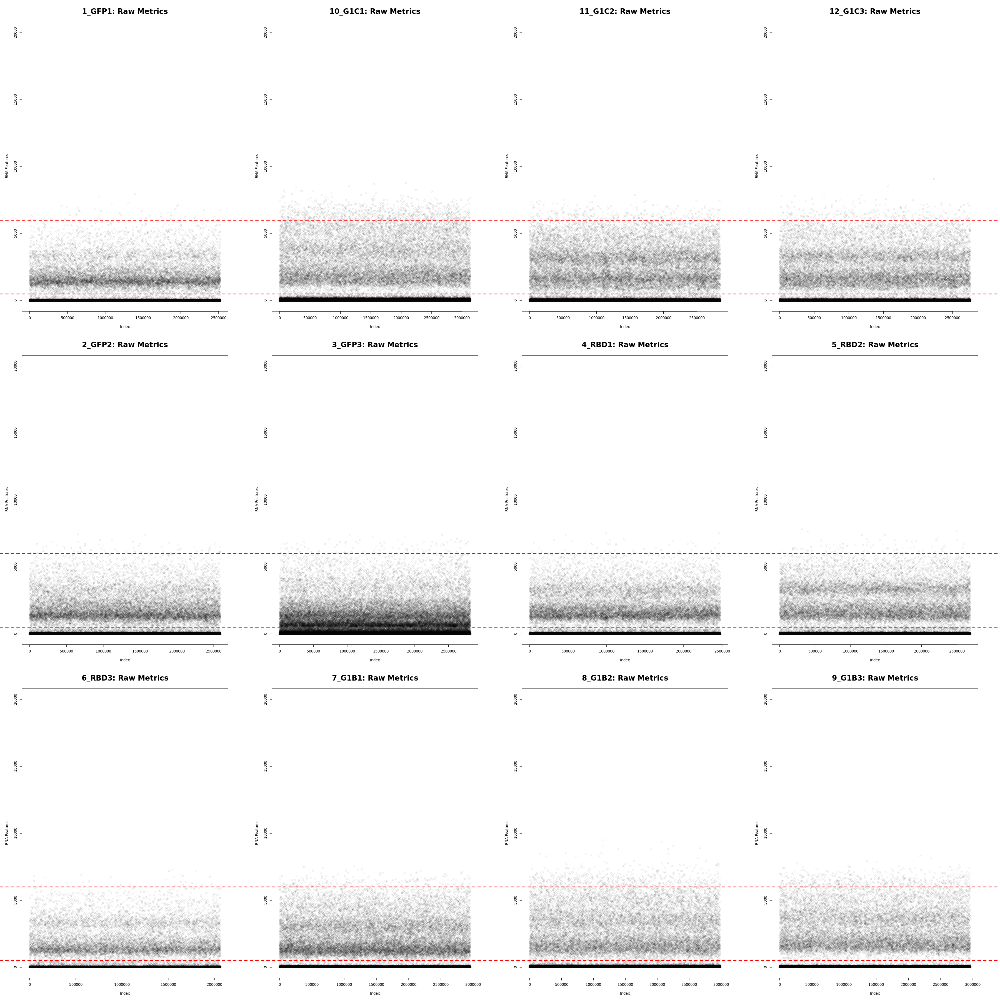

In [12]:
par(mfrow=c(3,4),xpd = T, mar = c(5,5,5,5))
options(repr.plot.width=30, repr.plot.height=30)

for (i in sample.ls){
 # Set sample variable
    gc(reset = TRUE)
    sample = i
    log_print(paste("Checking sample: ", i))
    sample.dir <- paste(cell.ranger.dir, sprintf('%s/outs/', sample), sep = "")
    # Load data
    rna_counts <- Read10X(file.path(sample.dir, 'raw_feature_bc_matrix/'))
    # Create seurat Object
    adata <- CreateSeuratObject(counts=rna_counts)
    # add sample ID
    adata$library = sample
    plot = plot(adata$nFeature_RNA,
     pch=21, col = rgb(0, 0, 0, 0.1),
     ylab= "\n RNA Features",
     ylim = c(0, 20000),
         cex=1, cex.main=2, cex.lab=1, cex.axis=1,
         main=sprintf("%s: Raw Metrics",sample))
    abline(h = 500, col="red", lwd=2, lty=2)
    #abline(h = 5000, col="red", lwd=2, lty=2)
    abline(h = 6000, col="red", lwd=2, lty=2)
    #abline(h = 7000, col="red", lwd=2, lty=2)
    #abline(h = 8000, col="red", lwd=2, lty=2)
    #abline(h = 10000, col="red", lwd=2, lty=2)
}

[1] "Checking sample:  10_G1C1"
[1] "Checking sample:  11_G1C2"
[1] "Checking sample:  12_G1C3"
[1] "Checking sample:  2_GFP2"
[1] "Checking sample:  3_GFP3"
[1] "Checking sample:  4_RBD1"
[1] "Checking sample:  5_RBD2"
[1] "Checking sample:  6_RBD3"
[1] "Checking sample:  7_G1B1"
[1] "Checking sample:  8_G1B2"
[1] "Checking sample:  9_G1B3"


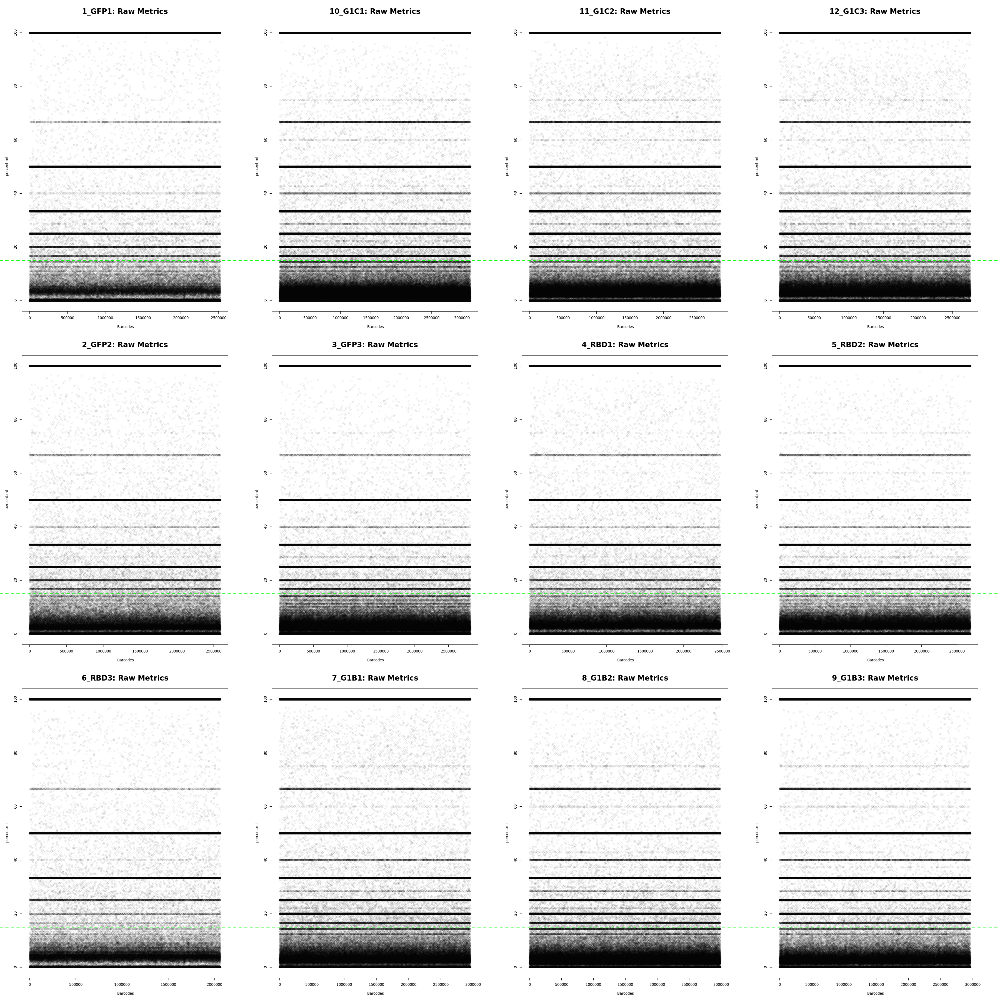

In [35]:
par(mfrow=c(3,4),xpd = T, mar = c(5,5,5,5))
options(repr.plot.width=30, repr.plot.height=30)
# Note: mouse mito gene are not "MT" but "mt"

for (i in sample.ls){
 # Set sample variable
    gc(reset = TRUE)
    sample = i
    log_print(paste("Checking sample: ", i))
    sample.dir <- paste(cell.ranger.dir, sprintf('%s/outs/', sample), sep = "")
    # Load data
    rna_counts <- Read10X(file.path(sample.dir, 'raw_feature_bc_matrix/'))
    # Create seurat Object
    adata <- CreateSeuratObject(counts=rna_counts)
    # add sample ID
    adata$library = sample
    # add mithochondrial fraction
    adata[['percent.mt']] <- PercentageFeatureSet(adata, pattern = "^mt-")
    plot = plot(adata$percent.mt,
     pch=21, col = rgb(0, 0, 0, 0.1),
     ylim = c(0, 100),
     ylab= "\n percent.mt",
     xlab= "\n Barcodes",
         cex=1, cex.main=2, cex.lab=1, cex.axis=1,
         main=sprintf("%s: Raw Metrics",sample))
    #abline(h = 2, col="green", lwd=2, lty=2)
    #abline(h = 5, col="green", lwd=2, lty=2)
    #abline(h = 10, col="green", lwd=2, lty=2)
    abline(h = 15, col="green", lwd=2, lty=2)
}

In [11]:
## Settings
nFeature_RNA.tresh.min = 500
nFeature_RNA.tresh.max = 6000
# Count_RNA.tresh.max = 30000
pct.mt.tresh = 15

In [23]:
snRNAseq_processing <- function(i) {
    gc(reset = TRUE)
    # Set sample variable
    sample = sample.ls[i]
    sample.ID = sample.ls[i]
    log_print(paste("Processing sample: ", sample))
    sample.dir <- paste(cell.ranger.dir, sprintf('%s/outs/', sample), sep = "")
    # Load data
    rna_counts <- Read10X(file.path(sample.dir, 'raw_feature_bc_matrix/'))
    # Create seurat Object
    adata <- CreateSeuratObject(counts=rna_counts)
    # add sample ID
    adata$samples = sample.ID
    # add mithochondrial fraction
    adata[['percent.mt']] <- PercentageFeatureSet(adata, pattern = '^mt-')
    
    # make UMIs/BC plots
    file = paste(step1.dir, sample.ID,"_UMIs_per_BCs.png", sep = "")
    png(file, width = 576, height = 576)
    bc_summary = adata$nCount_RNA[order(adata$nCount_RNA, decreasing=TRUE)]

    data = NULL
    data$nCount_RNA = bc_summary
    data$BC_rank = names(bc_summary)

    data = as.data.frame(data)
    plot(data$nCount_RNA, log='xy', type='l', main=paste(sample.ID, "_RNA UMIs", sep = ""),
             xlab="BC Rank", ylab="Number RNA UMIs", col='dark green', lwd=2)
    garbage <- dev.off()
    invisible(gc())
    
    # save total barcodes
        prefilter.barcodes = length(colnames(adata[["RNA"]]))
    # Filter by parameter: RNA nFeatures
    adata_sub.RNA <- subset(x = adata, subset = nFeature_RNA >= nFeature_RNA.tresh.min)
        barcodes.RNAFeatures.min = length(colnames(adata_sub.RNA[["RNA"]]))
    adata_sub.RNA <- subset(x = adata_sub.RNA, subset = nFeature_RNA <= nFeature_RNA.tresh.max)
        barcodes.RNAFeatures.max = length(colnames(adata_sub.RNA[["RNA"]]))
    #adata_sub.RNA <- subset(x = adata_sub.RNA, subset = nCount_RNA <= Count_RNA.tresh.max)
        #barcodes.RNACount.max = length(colnames(adata_sub.RNA[["RNA"]]))
    adata_sub.RNA <- subset(x = adata_sub.RNA, subset = percent.mt <= pct.mt.tresh)
        barcodes.pctMT.max = length(colnames(adata_sub.RNA[["RNA"]]))
    
    # Grab stats for RNA
        RNA.feature.mean = mean(adata_sub.RNA$nFeature_RNA)
        RNA.feature.median = median(adata_sub.RNA$nFeature_RNA)
        percent.mt.median = median(adata_sub.RNA$percent.mt)
        percent.mt.mean = mean(adata_sub.RNA$percent.mt)
        # Pile up QC
        qc.data$sample.ID = rbind(qc.data$sample.ID, sample.ID)
        qc.data$prefilter.barcodes = rbind(qc.data$prefilter.barcodes, prefilter.barcodes)    
        qc.data$barcodes.RNAFeatures.min = rbind(qc.data$barcodes.RNAFeatures.min, barcodes.RNAFeatures.min)
        qc.data$barcodes.RNAFeatures.max = rbind(qc.data$barcodes.RNAFeatures.max, barcodes.RNAFeatures.max) 
        #qc.data$barcodes.RNACount.max = rbind(qc.data$barcodes.RNACount.max, barcodes.RNACount.max)  
        qc.data$barcodes.pctMT.max = rbind(qc.data$barcodes.pctMT.max, barcodes.pctMT.max)  
    
        qc.data$RNA.feature.mean = rbind(qc.data$RNA.feature.mean, RNA.feature.mean)
        qc.data$RNA.feature.median = rbind(qc.data$RNA.feature.median, RNA.feature.median)
        qc.data$percent.mt.mean = rbind(qc.data$percent.mt.mean, percent.mt.mean)
        qc.data$percent.mt.median = rbind(qc.data$percent.mt.median, percent.mt.median)
    log_print("   - Analysing")
    # RNA analysis
    DefaultAssay(adata_sub.RNA) <- 'RNA'
    adata_sub.RNA = SCTransform(adata_sub.RNA, verbose = FALSE)
    DefaultAssay(adata_sub.RNA) <- "SCT"
    adata_sub.RNA = RunPCA(adata_sub.RNA, verbose = FALSE)
    adata_sub.RNA = RunUMAP(adata_sub.RNA, dims = 1:30, verbose = FALSE)
    adata_sub.RNA = FindNeighbors(adata_sub.RNA, dims = 1:30, verbose = FALSE)
    adata_sub.RNA = FindClusters(adata_sub.RNA, algorithm = 4, resolution = 0.5, verbose = FALSE)

    #add some log transformed metadata_sub
    adata_sub.RNA$log_nFeature_SCT = log(adata_sub.RNA$nFeature_SCT)
    adata_sub.RNA$log_nCount_SCT = log(adata_sub.RNA$nCount_SCT)

    ### Save intermediate RDS
    log_print("   - Saving")
    file = paste(step1.dir, sample.ID, "_pre.filt.rds", sep = "")
    saveRDS(adata_sub.RNA, file = file)

    ## Save barcodes
    file = paste(step1.dir, sample.ID, "_filtered.barcodes.txt", sep = "")
    filtered_bcs <- colnames(adata_sub.RNA[["RNA"]])
    write(filtered_bcs, file=file) 
    log_print("   - Done!")
    return(qc.data)
}

In [24]:
cores <- 12
cl <- makeCluster(cores)
setDefaultCluster(cl)

qc.data = NULL
log_print(paste("Starting the analysis"))

# Process samples
qc.data.ls <- mclapply(1:length(sample.ls), function(i) snRNAseq_processing(i), mc.cores = cores)

[1] "Starting the analysis"


In [25]:
# Clean up the parallel backend
setDefaultCluster(NULL)
stopCluster(cl)

In [26]:
# Combine results into single dataframe
qc.data <- as.data.frame(do.call(rbind, qc.data.ls))
file = paste(step1.dir, "Cell.res.qc", sep = "")
fwrite(qc.data, file, sep='\t', row.names=FALSE, col.names=TRUE, quote=FALSE)

# QC plots

In [27]:
qc.data = read.table(paste(step1.dir, "Cell.res.qc", sep = ""), sep = "\t", header = TRUE)

In [28]:
head(qc.data, n = 2)

,sample.ID,prefilter.barcodes,barcodes.RNAFeatures.min,barcodes.RNAFeatures.max,barcodes.pctMT.max,RNA.feature.mean,RNA.feature.median,percent.mt.mean,percent.mt.median
,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
1,1_GFP1,2523671,12242,12196,12024,2015.363,1673,1.572537,0.403280
2,10_G1C1,3137113,16083,15156,14679,2861.085,2481,2.871536,2.572169


gather: reorganized (prefilter.barcodes, barcodes.RNAFeatures.min, barcodes.RNAFeatures.max, barcodes.pctMT.max) into (Filter.step, barcodes.number) [was 12x9, now 48x7]


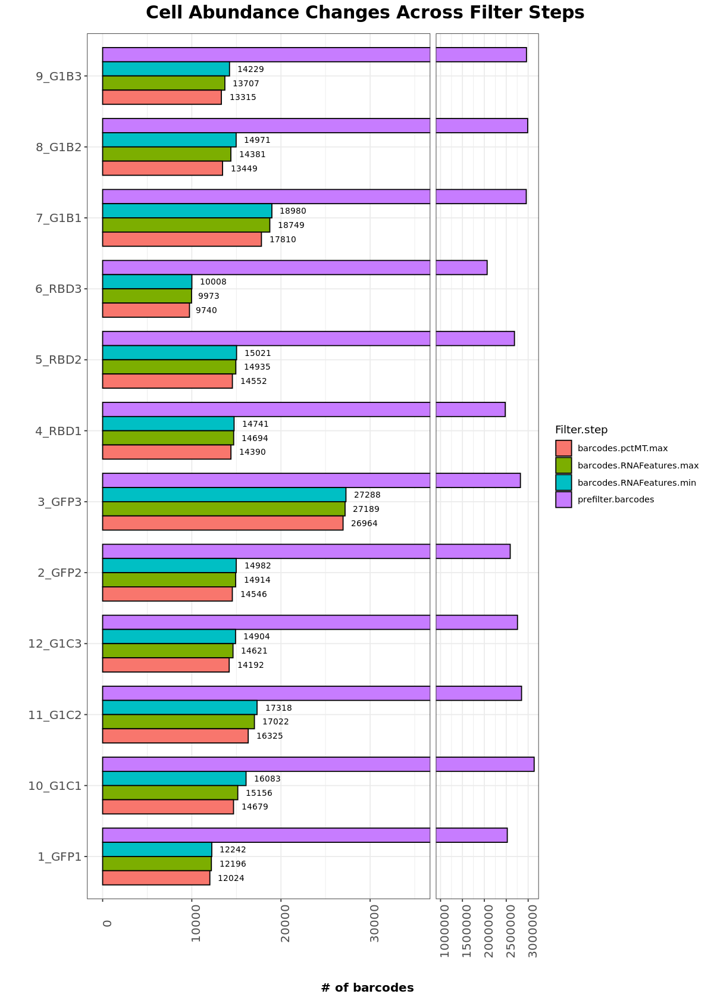

In [37]:
# Plot number of barcodes pre and post-filters
mat <- qc.data %>% gather(Filter.step, barcodes.number, 2:5)
mat$Filter.step = factor(mat$Filter.step, levels = c('barcodes.pctMT.max','barcodes.RNAFeatures.max', 'barcodes.RNAFeatures.min', 'prefilter.barcodes'))
mat$labels = as.numeric(mat$barcodes.number)
mat$labels[mat$labels > 40000] = ""

options(repr.plot.width=10, repr.plot.height=14)
width = 0.8

ggplot(mat, aes(x= sample.ID, y = barcodes.number, fill = Filter.step, label = labels)) + 
            theme_bw () +
            labs(y= "\n # of barcodes", x = "", title = "Cell Abundance Changes Across Filter Steps") +
            geom_bar(stat="identity", 
                     position = position_dodge(width = width), width = width,
                     colour="black") +
            scale_y_break(c(35000, 1000000),scales = 0.3) +
            theme(axis.text = element_text(size = 12), axis.title = element_text(size = 12, face = "bold"),
                  axis.text.x = element_text(angle = 90),
                             plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))+
            geom_text(hjust = -0.3, size = 2.9, position = position_dodge(width = width))+
            coord_flip()

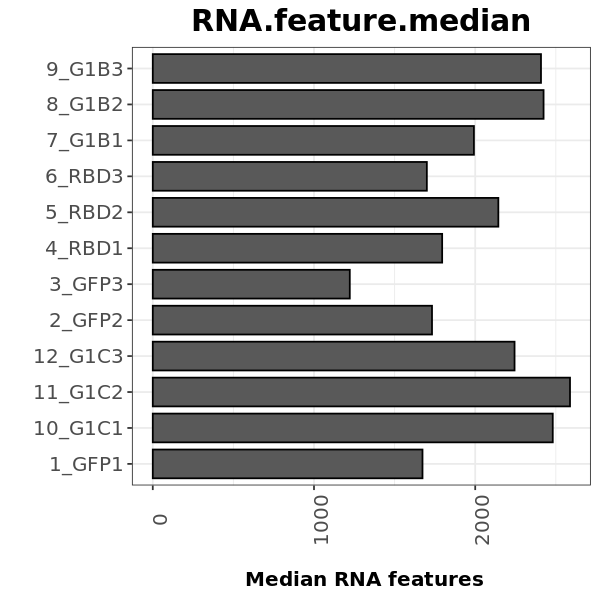

In [30]:
# Plot median features
options(repr.plot.width=5, repr.plot.height=5)
width = 0.8
ggplot(qc.data, aes(x= sample.ID, y = RNA.feature.median)) + 
            theme_bw () +
            labs(y= "\n Median RNA features", x = "", title = "RNA.feature.median") +
            geom_bar(stat="identity", 
                     position = position_dodge(width = width), width = width,
                     colour="black") +
            theme(axis.text = element_text(size = 12), axis.title = element_text(size = 12, face = "bold"),
                  axis.text.x = element_text(angle = 90),
                             plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))+
            coord_flip()

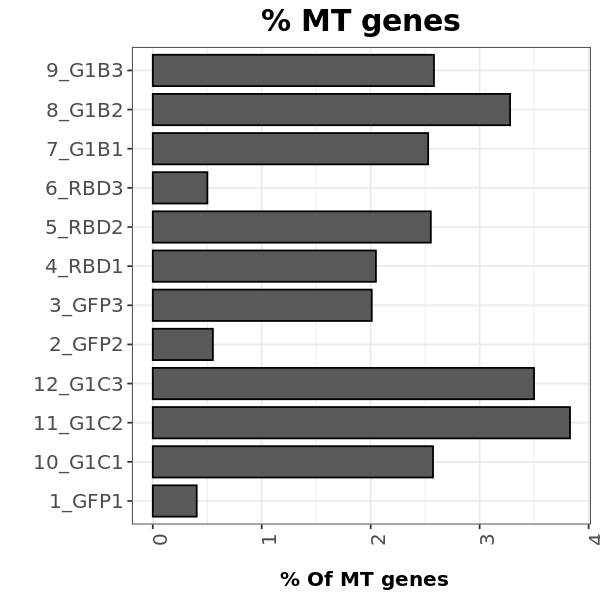

In [31]:
options(repr.plot.width=5, repr.plot.height=5)

width = 0.8
position = position_dodge(width = width)
ggplot(qc.data, aes(x= sample.ID, y = percent.mt.median)) + 
            theme_bw () +
            labs(y= "\n % Of MT genes", x = "", title = "% MT genes") +
            geom_bar(stat="identity", 
                     position = position, width = width,
                     colour="black") +
            theme(axis.text = element_text(size = 12), axis.title = element_text(size = 12, face = "bold"),
                  axis.text.x = element_text(angle = 90),
                             plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))+
            coord_flip()


# Seurat Plots

In [38]:
for (i in seq_along(sample.ls)){
    gc(reset = TRUE)
    # Set sample variable
    sample = sample.ls[i]
    sample.ID = sample.ls[i]
    log_print(paste("Generating plots for sample: ", sample))
    sample.dir <- paste(cell.ranger.dir, sprintf('%s/outs/', sample), sep = "")
    # Load sample
    adata = readRDS(paste(step1.dir, sample.ID, "_pre.filt.rds", sep = ""))
    
    # Generate UMAPS
    file = paste(step1.dir, sample.ID,"_UMAPs.png", sep = "")
    png(file, width = 576, height = 576)
    p1 <- DimPlot(adata, group.by='seurat_clusters', label=TRUE, label.size=8, repel=TRUE)
    p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle(sample.ID) + theme(legend.position = "none")
    print(p1)
    garbage <- dev.off()
    
    # Make Violin plots
    file = paste(step1.dir, sample.ID,"_metrics.png", sep = "")
    png(file, width = 2304, height = 1536)
    p1 <- VlnPlot(adata, features='nCount_SCT', group.by='seurat_clusters', pt.size=0, log=TRUE) + geom_boxplot(width=.6, fill='white', alpha=.6, pt.size=0) + geom_hline(yintercept=median(adata$nCount_SCT), linetype='dashed', lw=2) + 
      theme(plot.title = element_text(size = 25), axis.text = element_text(size=20))
    p2 <- VlnPlot(adata, features='nFeature_SCT', group.by='seurat_clusters', pt.size=0, log=TRUE) + geom_boxplot(width=.6, fill='white', alpha=.6, pt.size=0) + geom_hline(yintercept=median(adata$nFeature_SCT), linetype='dashed', lw=2) + 
      theme(plot.title = element_text(size = 25), axis.text = element_text(size=20))
    p3 <- VlnPlot(adata, features='nCount_RNA', group.by='seurat_clusters', pt.size=0, log=TRUE) + geom_boxplot(width=.6, fill='white', alpha=.6, pt.size=0) + geom_hline(yintercept=median(adata$nCount_SCT), linetype='dashed', lw=2) + 
      theme(plot.title = element_text(size = 25), axis.text = element_text(size=20))
    p4 <- VlnPlot(adata, features='nFeature_RNA', group.by='seurat_clusters', pt.size=0, log=TRUE) + geom_boxplot(width=.6, fill='white', alpha=.6, pt.size=0) + geom_hline(yintercept=median(adata$nFeature_SCT), linetype='dashed', lw=2) + 
      theme(plot.title = element_text(size = 25), axis.text = element_text(size=20))
    figure <- ggarrange(p1, p2, p3, p4, ncol = 2, nrow = 2,
                        common.legend = TRUE,legend="none")
    print(figure)
    garbage <- dev.off()
    
    # Plot RNA features post filters
    file = paste(step1.dir, sample.ID,"_RNA.features.density.png", sep = "")
    png(file, width = 576, height = 576)
    options(repr.plot.width=8, repr.plot.height=8)
    data = as.numeric(adata@meta.data$nFeature_RNA)
    data[data > 10000] = 10000
    quants = quantile(data)
    figure = ggplot(data=adata@meta.data, mapping = aes(x=data)) +
                labs(title = paste(sample.ID, "\n", "RNA Features \n\n", 
                              paste("q2:", quants[2], '|',
                                    "q3:", quants[3], '|',
                                    "q4:", quants[4], '|'),sep = "")) +
                geom_density(alpha = 0.2, fill= 'lightpink', color="pink") + 
                theme_linedraw() + labs(x="nFeature_RNA") +
                geom_vline(xintercept=c(quants[2],quants[3],quants[4]), 
                           colour=c("blue", "red", "black"),linetype = "longdash") +
                scale_x_continuous(breaks=c(0,2000, 4000, 6000, 8000 ,10000),
                                   labels=c("0", "2k", "4k", "6k", "8k", ">=10k"))+
                theme(title=element_blank(),
                axis.text.x=element_text(size=20, vjust=0.5, angle = 90),
                axis.text.y=element_text(size=20, vjust=0.5),
                axis.title.x = element_text(size=25, vjust=-0.35),
                axis.title.y = element_text(size=25, vjust=0.5),
                plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))
    print(figure)
    garbage <- dev.off()
}

[1] "Generating plots for sample:  1_GFP1"
[1] "Generating plots for sample:  10_G1C1"
[1] "Generating plots for sample:  11_G1C2"
[1] "Generating plots for sample:  12_G1C3"
[1] "Generating plots for sample:  2_GFP2"
[1] "Generating plots for sample:  3_GFP3"
[1] "Generating plots for sample:  4_RBD1"
[1] "Generating plots for sample:  5_RBD2"
[1] "Generating plots for sample:  6_RBD3"
[1] "Generating plots for sample:  7_G1B1"
[1] "Generating plots for sample:  8_G1B2"
[1] "Generating plots for sample:  9_G1B3"
